# 2.2.2 例題: ベイズ的 A/Bテスト
サイトAを見せられたユーザーが最終的にコンバージョンにつながる確率を$p_A$と仮定し、$N$人がサイトAを見せられて、そのうち$n$人がコンバージョンにつながったとする。

In [1]:
using Distributed
addprocs(3)

3-element Array{Int64,1}:
 2
 3
 4

In [2]:
using Distributions
@everywhere using Mamba
using LaTeXStrings
using Plots
using Printf

In [3]:
# 定数をセット
p_true = 0.05
N = 1500

occurrences = rand(Bernoulli(p_true), N)

1500-element Array{Int64,1}:
 0
 0
 0
 0
 0
 0
 0
 0
 0
 0
 0
 0
 0
 ⋮
 0
 0
 0
 0
 0
 1
 0
 0
 0
 0
 1
 0

In [4]:
sum(occurrences)

62

In [5]:
println("The observed frequency: ", mean(occurrences))
println("Does the observed frequence equal to the true frequency? ", mean(occurrences) == p_true)

The observed frequency: 0.04133333333333333
Does the observed frequence equal to the true frequency? false


In [6]:
model0 = Model(
    obs = Stochastic(1, p -> Bernoulli(p), false),
    p = Stochastic(() -> Uniform()),
)

Object of type "Model"
-------------------------------------------------------------------------------
p:
A monitored node of type "ScalarStochastic"
NaN
-------------------------------------------------------------------------------
obs:
An unmonitored node of type "0-element ArrayStochastic{1}"
Float64[]


In [7]:
data0 = Dict{Symbol, Any}(
    :obs => occurrences,
    :N => N,
)

Dict{Symbol,Any} with 2 entries:
  :N   => 1500
  :obs => [0, 0, 0, 0, 0, 0, 0, 0, 0, 0  …  0, 0, 0, 1, 0, 0, 0, 0, 1, 0]

In [8]:
inits0 = [
    Dict{Symbol, Any}(
        :obs => occurrences,
        :p => rand(Uniform()),
    ) for _ in 1:3
]

3-element Array{Dict{Symbol,Any},1}:
 Dict(:p=>0.38582,:obs=>[0, 0, 0, 0, 0, 0, 0, 0, 0, 0  …  0, 0, 0, 1, 0, 0, 0, 0, 1, 0]) 
 Dict(:p=>0.628136,:obs=>[0, 0, 0, 0, 0, 0, 0, 0, 0, 0  …  0, 0, 0, 1, 0, 0, 0, 0, 1, 0])
 Dict(:p=>0.625706,:obs=>[0, 0, 0, 0, 0, 0, 0, 0, 0, 0  …  0, 0, 0, 1, 0, 0, 0, 0, 1, 0])

In [9]:
scheme0 = [NUTS(:p)]

1-element Array{Sampler{Mamba.NUTSTune},1}:
 An object of type "Sampler{Mamba.NUTSTune}"
Sampling Block Nodes:
Symbol[:p]

CodeInfo(
1 ─ %1 = π (##270#272{Symbol,Pairs{Union{},Union{},Tuple{},NamedTuple{(),Tuple{}}}}(:forward, Base.Iterators.Pairs{Union{},Union{},Tuple{},NamedTuple{(),Tuple{}}}()), Const(##270#272{Symbol,Pairs{Union{},Union{},Tuple{},NamedTuple{(),Tuple{}}}}(:forward, Base.Iterators.Pairs{Union{},Union{},Tuple{},NamedTuple{(),Tuple{}}}()), false))
│   %2 = (%1)(model, block)::Any
└──      return %2
) => Any


In [10]:
setsamplers!(model0, scheme0)
sim0 = mcmc(model0, data0, inits0, 20000, burnin = 1000, thin = 1, chains = 3)

MCMC Simulation of 20000 Iterations x 3 Chains...

      From worker 4:	Chain 2:   0% [2:36:30 of 2:36:34 remaining]
      From worker 2:	Chain 1:   0% [2:40:47 of 2:40:52 remaining]
      From worker 3:	Chain 3:   0% [2:41:53 of 2:41:58 remaining]
      From worker 4:	Chain 2:  10% [0:01:02 of 0:01:09 remaining]
      From worker 2:	Chain 1:  10% [0:01:04 of 0:01:11 remaining]
      From worker 3:	Chain 3:  10% [0:01:03 of 0:01:10 remaining]
      From worker 4:	Chain 2:  20% [0:00:33 of 0:00:41 remaining]
      From worker 2:	Chain 1:  20% [0:00:33 of 0:00:42 remaining]
      From worker 3:	Chain 3:  20% [0:00:33 of 0:00:42 remaining]
      From worker 4:	Chain 2:  30% [0:00:22 of 0:00:32 remaining]
      From worker 2:	Chain 1:  30% [0:00:22 of 0:00:32 remaining]
      From worker 3:	Chain 3:  30% [0:00:22 of 0:00:32 remaining]
      From worker 4:	Chain 2:  40% [0:00:16 of 0:00:27 remaining]
      From worker 2:	Chain 1:  40% [0:00:16 of 0:00:27 remaining]
      From worker 3:	Chai

Object of type "ModelChains"

Iterations = 1001:20000
Thinning interval = 1
Chains = 1,2,3
Samples per chain = 19000

[0.0360007; 0.0360007; … ; 0.0441597; 0.0441597]

[0.0475355; 0.0475355; … ; 0.0386112; 0.0386112]

[0.0421018; 0.0420823; … ; 0.0378788; 0.0419655]

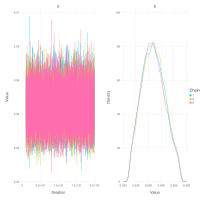

In [11]:
p0 = Mamba.plot(sim0, legend = true)
Mamba.draw(p0, nrow = 1, ncol = 2)

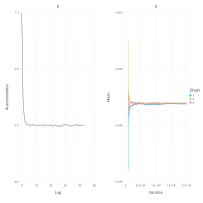

In [12]:
p0 = Mamba.plot(sim0, [:autocor, :mean], legend = true)
Mamba.draw(p0, nrow = 1, ncol = 2)

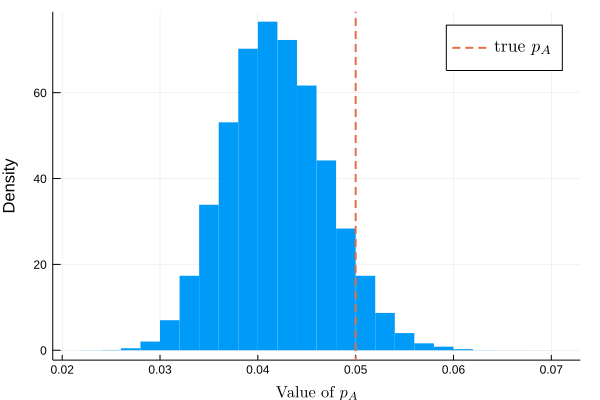

In [13]:
histogram(vec(sim0[:, :p, :].value), bins = 30, normalize = :pdf,
        linecolor = :transparent, label = "", xlabel = L"\mbox{Value of }p_A", ylabel = "Density")
plot!([p_true], seriestype = :vline, linestyle = :dash, linewidth = 2,
    label = L"\mbox{true }p_A", legendfontsize = 12)

### $N$を変えて事後分布の変化を見る
N=1500, 5000, 15000の3種類を試してみよう。

In [14]:
ab_sim = []
Ns = [1500, 5000, 15000]
for n in Ns
    ab_occur = rand(Bernoulli(p_true), n)
    ab_data = Dict{Symbol, Any}(
        :obs => ab_occur,
        :N => n,
    )
    ab_inits = [
        Dict{Symbol, Any}(
            :obs => ab_occur,
            :p => rand(Uniform()),
        ) for _ in 1:3
    ]
    push!(ab_sim, mcmc(model0, ab_data, ab_inits, 20000, 
                        burnin = 1000, thin = 1, chains = 3))
end

MCMC Simulation of 20000 Iterations x 3 Chains...

      From worker 3:	Chain 3:   0% [0:00:30 of 0:00:30 remaining]
      From worker 4:	Chain 1:   0% [0:00:28 of 0:00:28 remaining]
      From worker 2:	Chain 2:   0% [0:00:34 of 0:00:34 remaining]
      From worker 3:	Chain 3:  10% [0:00:15 of 0:00:17 remaining]
      From worker 2:	Chain 2:  10% [0:00:15 of 0:00:17 remaining]
      From worker 4:	Chain 1:  10% [0:00:16 of 0:00:18 remaining]
      From worker 3:	Chain 3:  20% [0:00:12 of 0:00:15 remaining]
      From worker 2:	Chain 2:  20% [0:00:12 of 0:00:15 remaining]
      From worker 4:	Chain 1:  20% [0:00:13 of 0:00:16 remaining]
      From worker 3:	Chain 3:  30% [0:00:10 of 0:00:14 remaining]
      From worker 2:	Chain 2:  30% [0:00:10 of 0:00:14 remaining]
      From worker 4:	Chain 1:  30% [0:00:10 of 0:00:15 remaining]
      From worker 3:	Chain 3:  40% [0:00:08 of 0:00:13 remaining]
      From worker 2:	Chain 2:  40% [0:00:08 of 0:00:14 remaining]
      From worker 4:	Chai

Nを大きくすると分布の裾野が狭くなり、分布の中心が真の値に近づいている

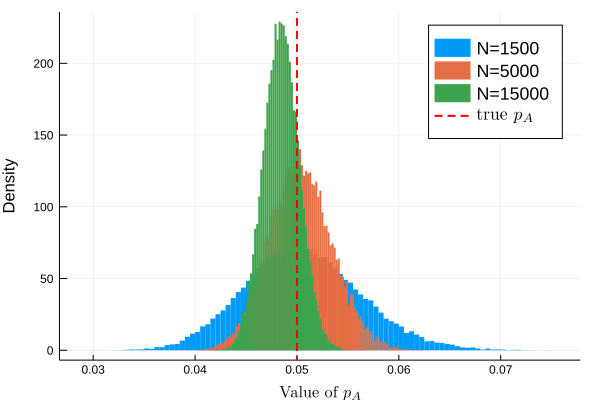

In [15]:
Plots.plot()
for (i, sim) in enumerate(ab_sim)
    histogram!(vec(sim[:, :p, :].value), normalize = :pdf,
            linecolor = :transparent, label = @sprintf("N=%d", Ns[i]), 
            xlabel = L"\mbox{Value of }p_A", ylabel = "Density")
end
Plots.plot!([p_true], seriestype = :vline, 
    linestyle = :dash, linewidth = 2, linecolor = :red,
    label = L"\mbox{true }p_A", legendfontsize = 12)

### AとBとを一緒に
サイトBについても同じように分析して$p_B$の事後確率を求める。さらに、$\delta = p_A - p_B$も加えて推論する。
まず本来は未知数である確率を定義。

In [16]:
true_p_A = 0.05
true_p_B = 0.04

0.04

観測データ数

In [17]:
N_A = 1500
N_B = 750

750

観測データの作成

In [18]:
observation_A = rand(Bernoulli(true_p_A), N_A)
observation_B = rand(Bernoulli(true_p_B), N_B)

750-element Array{Int64,1}:
 0
 0
 0
 0
 0
 0
 0
 0
 0
 0
 0
 0
 0
 ⋮
 0
 0
 0
 0
 0
 0
 0
 0
 0
 0
 0
 0

それぞれの平均を表示

In [19]:
println(mean(observation_A))
println(mean(observation_B))

0.042666666666666665
0.034666666666666665


Mambaモデルを作る

In [20]:
model1 = Model(
    obs_A = Stochastic(1, p_A -> Bernoulli(p_A), false),
    obs_B = Stochastic(1, p_B -> Bernoulli(p_B), false),
    
    delta = Logical((p_A, p_B) -> p_A - p_B),
    
    p_A = Stochastic(() -> Uniform()),
    p_B = Stochastic(() -> Uniform()),
)

Object of type "Model"
-------------------------------------------------------------------------------
obs_A:
An unmonitored node of type "0-element ArrayStochastic{1}"
Float64[]
-------------------------------------------------------------------------------
p_B:
A monitored node of type "ScalarStochastic"
NaN
-------------------------------------------------------------------------------
obs_B:
An unmonitored node of type "0-element ArrayStochastic{1}"
Float64[]
-------------------------------------------------------------------------------
p_A:
A monitored node of type "ScalarStochastic"
NaN
-------------------------------------------------------------------------------
delta:
A monitored node of type "ScalarLogical"
NaN


In [21]:
data1 = Dict{Symbol, Any}(
    :obs_A => observation_A,
    :obs_B => observation_B,
)

Dict{Symbol,Any} with 2 entries:
  :obs_A => [0, 0, 0, 0, 0, 0, 0, 0, 1, 0  …  0, 0, 0, 0, 0, 0, 0, 0, 0, 0]
  :obs_B => [0, 0, 0, 0, 0, 0, 0, 0, 0, 0  …  0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

In [22]:
inits1 = [
    begin
        p_A = rand(Uniform())
        p_B = rand(Uniform())
        Dict{Symbol, Any}(
            :obs_A => observation_A,
            :obs_B => observation_B,
            :p_A => p_A,
            :p_B => p_B,
            :delta => p_A - p_B,
        )
    end
    for _ in 1:3
]

3-element Array{Dict{Symbol,Any},1}:
 Dict(:obs_A=>[0, 0, 0, 0, 0, 0, 0, 0, 1, 0  …  0, 0, 0, 0, 0, 0, 0, 0, 0, 0],:p_B=>0.320528,:obs_B=>[0, 0, 0, 0, 0, 0, 0, 0, 0, 0  …  0, 0, 0, 0, 0, 0, 0, 0, 0, 0],:p_A=>0.715155,:delta=>0.394627) 
 Dict(:obs_A=>[0, 0, 0, 0, 0, 0, 0, 0, 1, 0  …  0, 0, 0, 0, 0, 0, 0, 0, 0, 0],:p_B=>0.0609274,:obs_B=>[0, 0, 0, 0, 0, 0, 0, 0, 0, 0  …  0, 0, 0, 0, 0, 0, 0, 0, 0, 0],:p_A=>0.607939,:delta=>0.547012)
 Dict(:obs_A=>[0, 0, 0, 0, 0, 0, 0, 0, 1, 0  …  0, 0, 0, 0, 0, 0, 0, 0, 0, 0],:p_B=>0.280033,:obs_B=>[0, 0, 0, 0, 0, 0, 0, 0, 0, 0  …  0, 0, 0, 0, 0, 0, 0, 0, 0, 0],:p_A=>0.93286,:delta=>0.652827)  

In [23]:
scheme1 = [NUTS([:p_A, :p_B])]

1-element Array{Sampler{Mamba.NUTSTune},1}:
 An object of type "Sampler{Mamba.NUTSTune}"
Sampling Block Nodes:
Symbol[:p_A, :p_B]

CodeInfo(
1 ─ %1 = π (##270#272{Symbol,Pairs{Union{},Union{},Tuple{},NamedTuple{(),Tuple{}}}}(:forward, Base.Iterators.Pairs{Union{},Union{},Tuple{},NamedTuple{(),Tuple{}}}()), Const(##270#272{Symbol,Pairs{Union{},Union{},Tuple{},NamedTuple{(),Tuple{}}}}(:forward, Base.Iterators.Pairs{Union{},Union{},Tuple{},NamedTuple{(),Tuple{}}}()), false))
│   %2 = (%1)(model, block)::Any
└──      return %2
) => Any


In [24]:
setsamplers!(model1, scheme1)
sim1 = mcmc(model1, data1, inits1, 25000, burnin = 5000, thin = 1, chains = 3)

MCMC Simulation of 25000 Iterations x 3 Chains...

      From worker 4:	Chain 2:   0% [0:03:17 of 0:03:17 remaining]
      From worker 3:	Chain 1:   0% [0:03:06 of 0:03:06 remaining]
      From worker 2:	Chain 3:   0% [0:01:47 of 0:01:47 remaining]
      From worker 4:	Chain 2:  10% [0:00:44 of 0:00:49 remaining]
      From worker 3:	Chain 1:  10% [0:00:45 of 0:00:50 remaining]
      From worker 2:	Chain 3:  10% [0:00:42 of 0:00:47 remaining]
      From worker 4:	Chain 2:  20% [0:00:38 of 0:00:47 remaining]
      From worker 3:	Chain 1:  20% [0:00:38 of 0:00:48 remaining]
      From worker 2:	Chain 3:  20% [0:00:38 of 0:00:47 remaining]
      From worker 3:	Chain 1:  30% [0:00:35 of 0:00:50 remaining]
      From worker 4:	Chain 2:  30% [0:00:35 of 0:00:50 remaining]
      From worker 2:	Chain 3:  30% [0:00:35 of 0:00:49 remaining]
      From worker 3:	Chain 1:  40% [0:00:29 of 0:00:48 remaining]
      From worker 4:	Chain 2:  40% [0:00:29 of 0:00:49 remaining]
      From worker 2:	Chai

Object of type "ModelChains"

Iterations = 5001:25000
Thinning interval = 1
Chains = 1,2,3
Samples per chain = 20000

[0.0445636 0.0343567 -0.0102069; 0.0545046 0.0383184 -0.0161861; … ; 0.0335165 0.0446172 0.0111006; 0.0335165 0.0446172 0.0111006]

[0.0417619 0.0457572 0.00399529; 0.0526678 0.0411064 -0.0115614; … ; 0.0229771 0.058411 0.0354338; 0.0229771 0.058411 0.0354338]

[0.0279819 0.0428297 0.0148478; 0.0294057 0.0391342 0.00972859; … ; 0.0305485 0.0373663 0.00681782; 0.0271589 0.0365745 0.00941561]

In [25]:
p1 = Mamba.plot(sim1[:, [:p_A, :p_B, :delta], :], legend = true)
Mamba.draw(p1, nrow = 3, ncol = 2)

In [26]:
p1 = Mamba.plot(sim1[:, [:p_A, :p_B, :delta], :], [:autocor, :mean], legend = true)
Mamba.draw(p1, nrow = 3, ncol = 2)

$N_B < N_A$のため、事後分布の裾は$p_B$の方が広い。

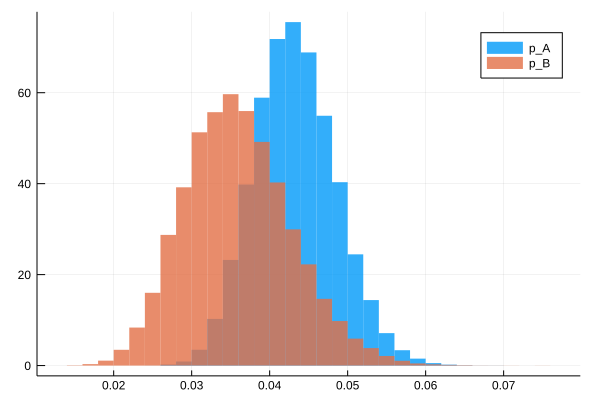

In [27]:
histogram(vec(sim1[:, :p_A, :].value), normalize = :pdf, bins=30, fillalpha = 0.8, linecolor = :transparent, label = "p_A")
histogram!(vec(sim1[:, :p_B, :].value), normalize = :pdf, bins=30, fillalpha = 0.8, linecolor = :transparent, label = "p_B")

### サイトAがサイトBよりも良い確率、悪い確率

In [30]:
println("Probability site A is worse than site B: ", mean(sim1[:, :delta, :].value .< 0))
println("Probability site A is better than site B: ", mean(sim1[:, :delta, :].value .> 0))

Probability site A is worse than site B: 0.0298
Probability site A is better than site B: 0.9702


### $N_A, N_B$を変えた時のdeltaの変化
サイトA, サイトBのデータを2倍にした時にdeltaの分布がどのように変化するかそれぞれ見てみよう。モデルを変える必要はない。

In [35]:
function mcmc_conversion(true_p_A, true_p_B, N_A, N_B)
    observation_A = rand(Bernoulli(true_p_A), N_A)
    observation_B = rand(Bernoulli(true_p_B), N_B)
    
    data = Dict{Symbol, Any}(
        :obs_A => observation_A,
        :obs_B => observation_B,
    )
    
    inits = [
        begin
            p_A = rand(Uniform())
            p_B = rand(Uniform())
            Dict{Symbol, Any}(
                :obs_A => observation_A,
                :obs_B => observation_B,
                :p_A => p_A,
                :p_B => p_B,
                :delta => p_A - p_B,
            )
        end
        for _ in 1:3
    ]
    
    mcmc(model1, data, inits, 25000, burnin = 5000, thin = 1, chains = 3)
end

mcmc_conversion (generic function with 1 method)

In [36]:
sim_N_A_doubled = mcmc_conversion(true_p_A, true_p_B, 2 * N_A, N_B)

MCMC Simulation of 25000 Iterations x 3 Chains...

      From worker 2:	Chain 2:   0% [0:03:05 of 0:03:05 remaining]
      From worker 4:	Chain 1:   0% [0:04:08 of 0:04:08 remaining]
      From worker 3:	Chain 3:   0% [0:03:60 of 0:04:00 remaining]
      From worker 4:	Chain 1:  10% [0:03:24 of 0:03:46 remaining]
      From worker 2:	Chain 2:  10% [0:03:26 of 0:03:49 remaining]
      From worker 3:	Chain 3:  10% [0:03:29 of 0:03:52 remaining]
      From worker 2:	Chain 2:  20% [0:03:09 of 0:03:57 remaining]
      From worker 4:	Chain 1:  20% [0:03:11 of 0:03:59 remaining]
      From worker 3:	Chain 3:  20% [0:03:13 of 0:04:01 remaining]
      From worker 4:	Chain 1:  30% [0:02:45 of 0:03:56 remaining]
      From worker 2:	Chain 2:  30% [0:02:46 of 0:03:57 remaining]
      From worker 3:	Chain 3:  30% [0:02:49 of 0:04:01 remaining]
      From worker 2:	Chain 2:  40% [0:02:20 of 0:03:54 remaining]
      From worker 4:	Chain 1:  40% [0:02:21 of 0:03:55 remaining]
      From worker 3:	Chai

Object of type "ModelChains"

Iterations = 5001:25000
Thinning interval = 1
Chains = 1,2,3
Samples per chain = 20000

[0.0428895 0.0446679 0.00177836; 0.0388761 0.0486479 0.00977182; … ; 0.0407514 0.0557902 0.0150388; 0.0407514 0.0557902 0.0150388]

[0.044377 0.0506474 0.00627037; 0.0478475 0.0401189 -0.00772866; … ; 0.046888 0.0500655 0.0031775; 0.046888 0.0500655 0.0031775]

[0.036013 0.0442224 0.00820943; 0.0349506 0.048735 0.0137843; … ; 0.0402818 0.0499284 0.00964663; 0.0328192 0.0470627 0.0142435]

In [37]:
sim_N_B_doubled = mcmc_conversion(true_p_A, true_p_B, N_A, 2 * N_B)

MCMC Simulation of 25000 Iterations x 3 Chains...

      From worker 4:	Chain 3:   0% [0:03:26 of 0:03:26 remaining]
      From worker 3:	Chain 2:   0% [0:05:30 of 0:05:30 remaining]
      From worker 2:	Chain 1:   0% [0:05:41 of 0:05:41 remaining]
      From worker 2:	Chain 1:  10% [0:02:18 of 0:02:33 remaining]
      From worker 3:	Chain 2:  10% [0:02:18 of 0:02:33 remaining]
      From worker 4:	Chain 3:  10% [0:02:20 of 0:02:35 remaining]
      From worker 4:	Chain 3:  20% [0:01:58 of 0:02:28 remaining]
      From worker 3:	Chain 2:  20% [0:01:58 of 0:02:28 remaining]
      From worker 2:	Chain 1:  20% [0:01:59 of 0:02:28 remaining]
      From worker 4:	Chain 3:  30% [0:01:44 of 0:02:28 remaining]
      From worker 2:	Chain 1:  30% [0:01:44 of 0:02:28 remaining]
      From worker 3:	Chain 2:  30% [0:01:44 of 0:02:29 remaining]
      From worker 2:	Chain 1:  40% [0:01:28 of 0:02:26 remaining]
      From worker 3:	Chain 2:  40% [0:01:28 of 0:02:27 remaining]
      From worker 4:	Chai

Object of type "ModelChains"

Iterations = 5001:25000
Thinning interval = 1
Chains = 1,2,3
Samples per chain = 20000

[0.0298897 0.0528101 0.0229204; 0.042401 0.0603335 0.0179325; … ; 0.0343309 0.057103 0.0227721; 0.0339348 0.0560113 0.0220765]

[0.0328013 0.0563955 0.0235941; 0.0359459 0.0618841 0.0259382; … ; 0.0451472 0.0596498 0.0145027; 0.0368836 0.0606886 0.0238049]

[0.0360325 0.0618206 0.0257882; 0.0472902 0.0557941 0.00850393; … ; 0.0355111 0.0673812 0.0318701; 0.0353709 0.0501779 0.014807]

$N_A$の数を2倍にしてもさほど推論の質は向上しない。$N_B$を増やした方が推論の質が上がる。

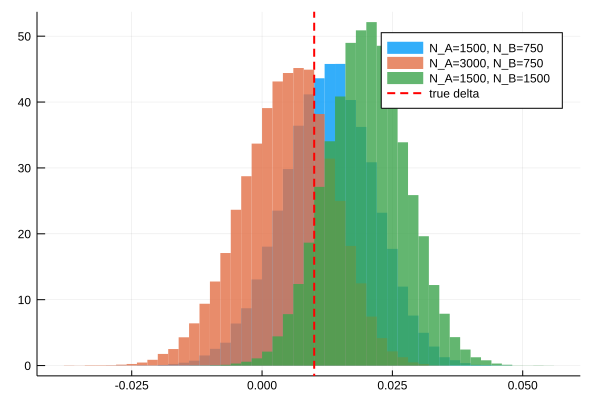

In [38]:
histogram(vec(sim1[:, :delta, :].value), normalize = :pdf, bins=50, 
            fillalpha = 0.8, linecolor = :transparent, label = "N_A=1500, N_B=750")
histogram!(vec(sim_N_A_doubled[:, :delta, :].value), normalize = :pdf, bins=50, 
            fillalpha = 0.8, linecolor = :transparent, label = "N_A=3000, N_B=750")
histogram!(vec(sim_N_B_doubled[:, :delta, :].value), normalize = :pdf, bins=50, 
            fillalpha = 0.8, linecolor = :transparent, label = "N_A=1500, N_B=1500")
vline!([true_p_A - true_p_B], linestyle = :dash, linewidth = 2, linecolor = :red, label = "true delta")

### $p_A, p_B$を変えた時のdeltaの変化

In [39]:
sim_p_A_plus = mcmc_conversion(true_p_A + 0.01, true_p_B, N_A, N_B)

MCMC Simulation of 25000 Iterations x 3 Chains...

      From worker 3:	Chain 3:   0% [0:02:37 of 0:02:37 remaining]
      From worker 4:	Chain 2:   0% [0:03:11 of 0:03:12 remaining]
      From worker 2:	Chain 1:   0% [0:03:15 of 0:03:15 remaining]
      From worker 2:	Chain 1:  10% [0:01:53 of 0:02:05 remaining]
      From worker 4:	Chain 2:  10% [0:01:56 of 0:02:09 remaining]
      From worker 3:	Chain 3:  10% [0:01:56 of 0:02:09 remaining]
      From worker 2:	Chain 1:  20% [0:01:37 of 0:02:02 remaining]
      From worker 3:	Chain 3:  20% [0:01:40 of 0:02:05 remaining]
      From worker 4:	Chain 2:  20% [0:01:41 of 0:02:06 remaining]
      From worker 2:	Chain 1:  30% [0:01:23 of 0:01:59 remaining]
      From worker 3:	Chain 3:  30% [0:01:24 of 0:02:01 remaining]
      From worker 4:	Chain 2:  30% [0:01:27 of 0:02:04 remaining]
      From worker 2:	Chain 1:  40% [0:01:10 of 0:01:57 remaining]
      From worker 3:	Chain 3:  40% [0:01:12 of 0:01:59 remaining]
      From worker 4:	Chai

Object of type "ModelChains"

Iterations = 5001:25000
Thinning interval = 1
Chains = 1,2,3
Samples per chain = 20000

[0.0289448 0.0589494 0.0300046; 0.0289448 0.0589494 0.0300046; … ; 0.0272646 0.0525054 0.0252408; 0.0367349 0.064488 0.027753]

[0.0318937 0.0510075 0.0191138; 0.0374435 0.049996 0.0125525; … ; 0.0331773 0.0440733 0.010896; 0.0425166 0.0540003 0.0114837]

[0.0291012 0.0519344 0.0228332; 0.0291012 0.0519344 0.0228332; … ; 0.0372783 0.0530661 0.0157879; 0.0334715 0.0537835 0.020312]

In [40]:
sim_p_B_minus = mcmc_conversion(true_p_A, true_p_B - 0.01, N_A, N_B)

MCMC Simulation of 25000 Iterations x 3 Chains...

      From worker 2:	Chain 1:   0% [0:03:34 of 0:03:34 remaining]
      From worker 4:	Chain 3:   0% [0:04:21 of 0:04:21 remaining]
      From worker 3:	Chain 2:   0% [0:04:54 of 0:04:55 remaining]
      From worker 2:	Chain 1:  10% [0:02:05 of 0:02:19 remaining]
      From worker 4:	Chain 3:  10% [0:02:06 of 0:02:20 remaining]
      From worker 3:	Chain 2:  10% [0:02:08 of 0:02:22 remaining]
      From worker 4:	Chain 3:  20% [0:01:55 of 0:02:23 remaining]
      From worker 2:	Chain 1:  20% [0:01:55 of 0:02:24 remaining]
      From worker 3:	Chain 2:  20% [0:01:55 of 0:02:24 remaining]
      From worker 2:	Chain 1:  30% [0:01:34 of 0:02:14 remaining]
      From worker 4:	Chain 3:  30% [0:01:34 of 0:02:14 remaining]
      From worker 3:	Chain 2:  30% [0:01:34 of 0:02:14 remaining]
      From worker 2:	Chain 1:  40% [0:01:18 of 0:02:09 remaining]
      From worker 3:	Chain 2:  40% [0:01:18 of 0:02:09 remaining]
      From worker 4:	Chai

Object of type "ModelChains"

Iterations = 5001:25000
Thinning interval = 1
Chains = 1,2,3
Samples per chain = 20000

[0.0203527 0.0577861 0.0374335; 0.0203527 0.0577861 0.0374335; … ; 0.0391435 0.0526256 0.0134821; 0.0391435 0.0526256 0.0134821]

[0.0446568 0.0533285 0.0086717; 0.0446568 0.0533285 0.0086717; … ; 0.02814 0.0542078 0.0260678; 0.0275989 0.0554366 0.0278377]

[0.0314949 0.0434002 0.0119053; 0.0269896 0.0445724 0.0175829; … ; 0.018539 0.0575741 0.0390351; 0.0315548 0.0622008 0.030646]

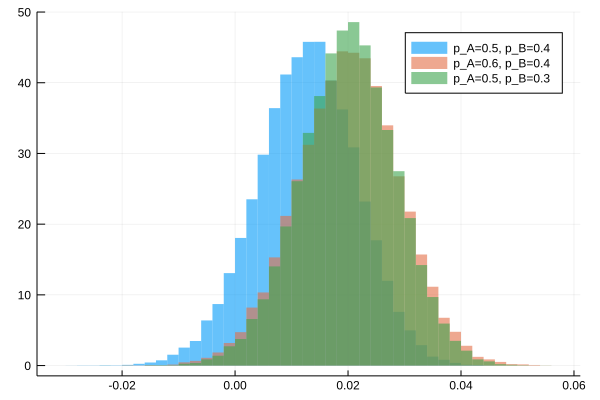

In [42]:
histogram(vec(sim1[:, :delta, :].value), normalize = :pdf, bins=50, 
            fillalpha = 0.6, linecolor = :transparent, label = "p_A=0.5, p_B=0.4")
histogram!(vec(sim_p_A_plus[:, :delta, :].value), normalize = :pdf, bins=50, 
            fillalpha = 0.6, linecolor = :transparent, label = "p_A=0.6, p_B=0.4")
histogram!(vec(sim_p_B_minus[:, :delta, :].value), normalize = :pdf, bins=50, 
            fillalpha = 0.6, linecolor = :transparent, label = "p_A=0.5, p_B=0.3")